In [1]:
#Paquetes a utilizar
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import Image

#Ejemplo 1: Simulación de Onda electromagnética

In [9]:
class SimuladorOndaEM(object):
  #Inicialización
  def __init__(self, freq = 300000000, E0 = 1, theta = 0,\
               epsr = 1, mur = 1, sigma = 0):
    #Constantes
    self.mu0 = 4 * np.pi * 10 ** (-7)               #Permeabilidad del vacío
    self.eps0 = 8.8542 * 10 ** (-12)                #Permitividaad del vacío
    self.c = 300 * 10 ** (6)                        #Velocidad de la luz en el vacío

    #Parámetros de la onda
    self.freq = freq                                #Frecuencia [Hz]
    self.E0 = E0                                    #Amplitud inicial de E
    self.theta = theta                              #Desfase [°]
    self.theta_rad = (self.theta * np.pi) / 180     #Desfase [rad]
    self.omega = 2 * np.pi * self.freq              #Frecuencia [rad]

    #Parámetros del medio
    self.mur = mur                                  #Permeabilidad relativa Medio
    self.epsr = epsr                                #Permitividad relativa Medio
    self.sigma = sigma                              #Conductividad Medio

    #Calculo de coeficientes y parámetros
    mu = self.mu0 * self.mur                        #Permeabilidad Medio 1
    eps = self.eps0 * self.epsr                     #Permitividad Medio 1
    self.alpha = 0                                  #Alpha Medio 1
    self.beta  = self.omega * np.sqrt(mu * eps)     #Beta Medio 1
    self.eta_mag = np.sqrt(mu / eps)                #Impedancia Medio 1 (magnitud)
    self.eta_phs = 0                                #Impedancia Medio 1 (fase)

    #Parámetros físicos:
    #Con estos escogeremos una ventana de tiempo y espacio apropiadas para la
    #simulación, de manera que podamos apreciar al menos 2 periodos de onda.
    self.lambda1 = 2 * np.pi / self.beta           #Longitud de onda Medio 1
    self.T = self.lambda1 * np.sqrt(mu * eps)    #Periodo de onda Medio

    #Parametros de grilla
    #Grilla espacial
    self.dz = self.lambda1 / 100                                #100 puntos
    self.zz = np.arange(0, 2 * self.lambda1 + self.dz, self.dz) #vector de z
    #Grilla temporal
    self.dt = self.T/ 200                                       #200 puntos
    self.tt = np.arange(0, 2 * self.T + self.dt, self.dt)       #vector de t

    #Vectores para almacenar datos
    #Los vectores E_zz y H_zz nos permitirán generar un frame de las
    #ondas eléctrica y magnética para un tiempo particular.
    self.E_zz = []
    self.H_zz = []
    #Los vectores E_tt y H_tt nos permitirán almacenar cada frame de
    #la simulación, para luego convertirlo en una animación.
    self.E_tt = []
    self.H_tt = []

  #Generamos la simulación
  def run(self):
    for i in range(0,len(self.tt)):
      #Onda Eléctrica
      self.E_zz = self.E0 * np.cos(self.omega * self.tt[i]\
                   - self.beta * self.zz + self.theta_rad)
      #Onda Magnética
      self.H_zz = (self.E0 / self.eta_mag) * np.cos(self.omega * self.tt[i]\
                   - self.beta * self.zz + self.theta_rad)
      #Guardamos los frames
      self.E_tt.append(self.E_zz.copy())
      self.H_tt.append(self.H_zz.copy())

  #Graficamos el resultado
  def plot(self):
    fig = plt.figure(figsize = (10, 5))                   #Instanciamos figura
    ax = fig.add_subplot(111, projection='3d')            #Modo 3D
    ax.plot(self.zz, np.zeros(len(self.zz)), self.E_zz, color = "r", linewidth = 2)   #Ploteamos E(z)
    ax.plot(self.zz, self.H_zz, np.zeros(len(self.zz)), color = "b", linewidth = 2)   #Ploteamos H(z)
    plt.xlabel("Z")                                       #Label del "Eje z"
    plt.grid(True)                                        #Añadir grilla
    plt.title("Onda EM simple")                           #Título
    plt.show()                                            #Desplegar

  #Generar un gif para la simulación
  def animate(self, file_dir = "OndaEM.gif", N = 200):
    E_tt = self.E_tt[-N:]                                 #Tomamos ultimos N frames de E_tt
    H_tt = self.H_tt[-N:]                                 #Tomamos ultimos N frames de E_tt

    #Le damos formato a la gráfica de la animación
    fig = plt.figure(figsize = (5, 5))                    #Instanciamos figura
    ax = fig.add_subplot(111, projection='3d')            #Formato 3D
    ax.set(xlim = [0, 2 * self.lambda1], ylim = [-0.05,0.05], zlim = [-1, 1])   #Rangos de la grafica
    line1 = ax.plot(self.zz, np.zeros(len(self.zz)), self.E_zz[0], color = "r", linewidth = 2)[0] #Instanciamos la primera gráfica
    line2 = ax.plot(self.zz, np.zeros(len(self.zz)), self.E_zz[0], color = "b", linewidth = 2)[0] #Instanciamos la primera gráfica
    plt.xlabel("Z")                                       #Label del "Eje z"
    plt.grid(True)                                        #Añadir grilla
    plt.title("Onda EM simple")                           #Título
    ax.grid(True)

    #Función para generar la animación a partir de los frames
    def animate(i):
      line1.set_data_3d(self.zz, np.zeros(len(self.zz)), E_tt[i])
      line2.set_data_3d(self.zz, H_tt[i], np.zeros(len(self.zz)))

    #Generamos la animación
    anim = FuncAnimation(fig, animate, interval = 50, frames = len(E_tt) - 1)
    anim.save(file_dir, writer = "pillow")

Veamos que tal funciona nuestro código:

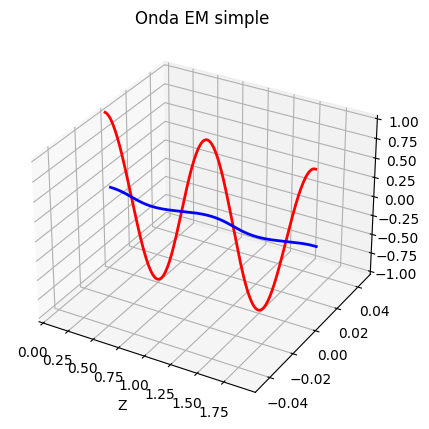

In [10]:
OndaEM = SimuladorOndaEM()  #Instanciamos la clase
OndaEM.run()                #Ejecutamos la simulación
#OndaEM.plot()               #Graficamos el ultimo frame
OndaEM.animate()            #Generamos la animación

Mostremos el .GIF

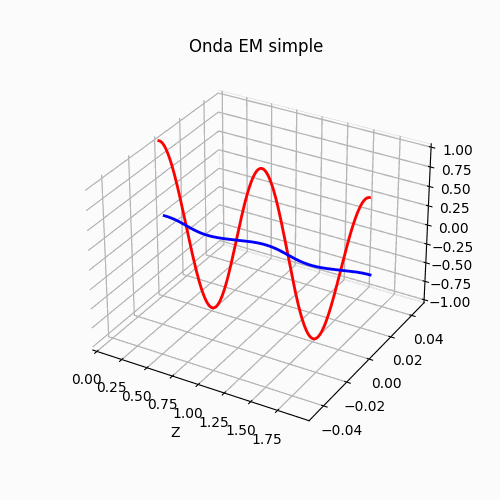

In [11]:
Image(open('/content/OndaEM.gif', 'rb').read())

#Ejemplo 2: Polarización Lineal

En esencia, utilizaremos el mismo código, pero aprovecharemos la sección de la onda magnética para convertirla en la segunda onda eléctrica.

In [12]:
class SimuladorPolarizacionLineal(object):
  #Inicialización
  def __init__(self, freq = 300000000, E0x = 1, E0y=1, theta = 0,\
               epsr = 1, mur = 1, sigma = 0):
    #Constantes
    self.mu0 = 4 * np.pi * 10 ** (-7)               #Permeabilidad del vacío
    self.eps0 = 8.8542 * 10 ** (-12)                #Permitividaad del vacío
    self.c = 300 * 10 ** (6)                        #Velocidad de la luz en el vacío

    #Parámetros de la onda
    self.freq = freq                                #Frecuencia [Hz]
    self.E0x = E0x                                  #Amplitud inicial de Ex
    self.E0y = E0y                                  #Amplitud inicial de Ey
    self.theta = theta                              #Desfase [°]
    self.theta_rad = (self.theta * np.pi) / 180     #Desfase [rad]
    self.omega = 2 * np.pi * self.freq              #Frecuencia [rad]

    #Parámetros del medio
    self.mur = mur                                  #Permeabilidad relativa Medio
    self.epsr = epsr                                #Permitividad relativa Medio
    self.sigma = sigma                              #Conductividad Medio

    #Calculo de coeficientes y parámetros
    mu = self.mu0 * self.mur                        #Permeabilidad Medio 1
    eps = self.eps0 * self.epsr                     #Permitividad Medio 1
    self.alpha = 0                                  #Alpha Medio 1
    self.beta  = self.omega * np.sqrt(mu * eps)     #Beta Medio 1
    self.eta_mag = np.sqrt(mu / eps)                #Impedancia Medio 1 (magnitud)
    self.eta_phs = 0                                #Impedancia Medio 1 (fase)

    #Parámetros físicos:
    #Con estos escogeremos una ventana de tiempo y espacio apropiadas para la
    #simulación, de manera que podamos apreciar al menos 2 periodos de onda.
    self.lambda1 = 2 * np.pi / self.beta           #Longitud de onda Medio
    self.T = self.lambda1 * np.sqrt(mu * eps)    #Periodo de onda Medio

    #Parametros de grilla
    #Grilla espacial
    self.dz = self.lambda1 / 100                                #100 puntos
    self.zz = np.arange(0, 2 * self.lambda1 + self.dz, self.dz) #vector de z
    #Grilla temporal
    self.dt = self.T/ 200                                       #200 puntos
    self.tt = np.arange(0, 2 * self.T + self.dt, self.dt)       #vector de t

    #Vectores para almacenar datos
    #Los vectores E_zz y H_zz nos permitirán generar un frame de las
    #ondas eléctrica y magnética para un tiempo particular.
    self.Ex_zz = []
    self.Ey_zz = []
    #Los vectores E_tt y H_tt nos permitirán almacenar cada frame de
    #la simulación, para luego convertirlo en una animación.
    self.Ex_tt = []
    self.Ey_tt = []

  #Generamos la simulación
  def run(self):
    for i in range(0,len(self.tt)):
      #Onda Eléctrica
      self.Ex_zz = self.E0x * np.cos(self.omega * self.tt[i]\
                   - self.beta * self.zz + self.theta_rad)
      #Onda Magnética
      self.Ey_zz = self.E0y * np.cos(self.omega * self.tt[i]\
                   - self.beta * self.zz + self.theta_rad)
      #Guardamos los frames
      self.Ex_tt.append(self.Ex_zz.copy())
      self.Ey_tt.append(self.Ey_zz.copy())

  #Graficamos el resultado
  def plot(self):
    fig = plt.figure(figsize = (10, 5))                   #Instanciamos figura
    ax = fig.add_subplot(111, projection='3d')            #Modo 3D
    ax.plot(self.zz, self.Ey_zz, self.Ex_zz, color = "r", linewidth = 2)   #Ploteamos E(z)
    plt.xlabel("Z")                                       #Label del "Eje z"
    plt.grid(True)                                        #Añadir grilla
    plt.title("Onda Eléctrica Polarizada Linealmente")    #Título
    plt.show()                                            #Desplegar

  #Generar un gif para la simulación
  def animate(self, file_dir = "OndaPL.gif", N = 200):
    Ex_tt = self.Ex_tt[-N:]                                 #Tomamos ultimos N frames de E_tt
    Ey_tt = self.Ey_tt[-N:]                                 #Tomamos ultimos N frames de E_tt

    #Le damos formato a la gráfica de la animación
    fig = plt.figure(figsize = (5, 5))                    #Instanciamos figura
    ax = fig.add_subplot(111, projection='3d')            #Formato 3D
    ax.set(xlim = [0, 2 * self.lambda1], ylim = [-1,1], zlim = [-1, 1])   #Rangos de la grafica
    line1 = ax.plot(self.zz, np.zeros(len(self.zz)), self.Ex_zz[0], color = "r", linewidth = 2)[0]
    plt.xlabel("Z")                                       #Label del "Eje z"
    plt.grid(True)                                        #Añadir grilla
    plt.title("Onda Eléctrica Polarizada Linealmente")    #Título
    ax.grid(True)

    #Función para generar la animación a partir de los frames
    def animate(i):
      line1.set_data_3d(self.zz, Ey_tt[i], Ex_tt[i])

    #Generamos la animación
    anim = FuncAnimation(fig, animate, interval = 50, frames = len(Ex_tt) - 1)
    anim.save(file_dir, writer = "pillow")

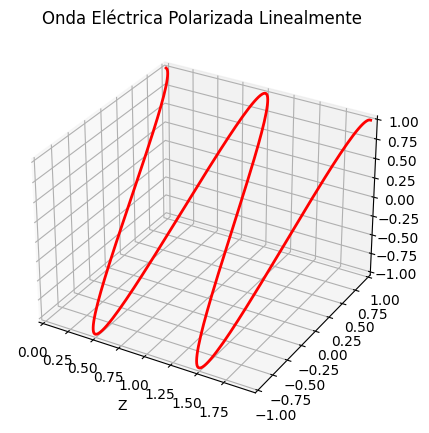

In [13]:
OndaPL = SimuladorPolarizacionLineal()  #Instanciamos la clase
OndaPL.run()                #Ejecutamos la simulación
#OndaPL.plot()               #Graficamos el ultimo frame
OndaPL.animate()            #Generamos la animación

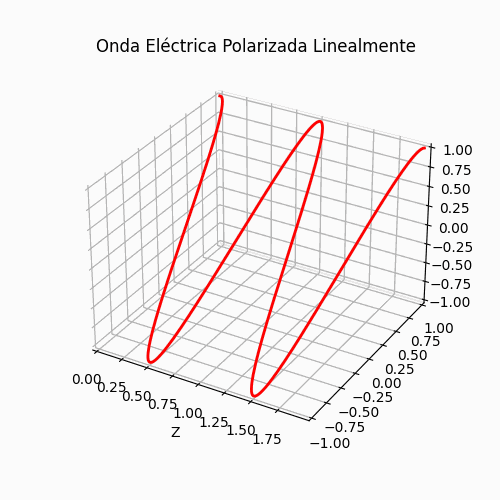

In [14]:
Image(open('/content/OndaPL.gif', 'rb').read())

#Propuesto: Polarización Elíptica

Simplemente basta con incluir un desfase

#Ejemplo 3: Onda Eléctrica en interfases sin perdidas

In [16]:
class SimuladorInterfases(object):
  def __init__(self, freq = 300000000, E0 = 1, theta = 0,\
               epsr1 = 1, epsr2 = 5, mur1 = 1, mur2 = 5,\
               sigma1 = 0, sigma2 = 0.02):
    #Constantes
    self.mu0 = 4 * np.pi * 10 ** (-7)               #Permeabilidad del vacío
    self.eps0 = 8.8542 * 10 ** (-12)                #Permitividaad del vacío
    self.c = 300 * 10 ** (6)                        #Velocidad de la luz en el vacío

    #Parámetros de la onda
    self.freq = freq                                #Frecuencia [Hz]
    self.E0 = E0                                    #Amplitud
    self.theta = theta                              #Desfase [°]
    self.theta_rad = (self.theta * np.pi) / 180     #Desfase [rad]
    self.omega = 2 * np.pi * self.freq              #Frecuencia [rad]

    #Parámetros del medio
    self.mur1 = mur1                                #Permeabilidad relativa Medio 1
    self.mur2 = mur2                                #Permeabilidad relativa Medio 2
    self.epsr1 = epsr1                              #Permitividad relativa Medio 1
    self.epsr2 = epsr2                              #Permitividad relativa Medio 2
    self.sigma1 = sigma1                            #Conductividad Medio 1
    self.sigma2 = sigma2                            #Conductividad Medio 2

    #Calculo de coeficientes y parámetros
    mu1 = self.mu0 * self.mur1                      #Permeabilidad Medio 1
    mu2 = self.mu0 * self.mur2                      #Permeabildad Medio 2
    eps1 = self.eps0 * self.epsr1                   #Permitividad Medio 1
    eps2 = self.eps0 * self.epsr2                   #Permitividad Medio 2
    self.alpha1 = 0                                 #Alpha Medio 1
    self.alpha2 = 0                                 #Alpha Medio 2
    self.beta1  = self.omega * np.sqrt(mu1 * eps1)  #Beta Medio 1
    self.beta2  = self.omega * np.sqrt(mu2 * eps2)  #Beta Medio 2
    self.eta_mag1 = np.sqrt(mu1 / eps1)             #Impedancia Medio 1 (magnitud)
    self.eta_mag2 = np.sqrt(mu2 / eps2)             #Impedancia Medio 2 (magnitud)
    self.eta_phs1 = 0                               #Impedancia Medio 1 (fase)
    self.eta_phs2 = 0                               #Impedancia Medio 2 (fase)

    #Coeficientes de reflexión y transmisión
    eta1 =  self.eta_mag1 * np.exp(1j * self.eta_phs1)  #Impedancia Medio 1
    eta2 =  self.eta_mag2 * np.exp(1j * self.eta_phs2)  #Impedancia Medio 2
    self.R = (eta2 - eta1) / (eta2 + eta1)              #Coeff. de Reflexión
    self.T = (2*eta2) / (eta2 + eta1)                   #Coeff. de Transmisión

    #Parámetros físicos:
    #Con estos escogeremos una ventana de tiempo y espacio apropiadas para la
    #simulación, de manera que podamos apreciar al menos 2 periodos de onda.
    self.lambda1 = 2 * np.pi / self.beta1           #Longitud de onda Medio 1
    self.lambda2 = 2 * np.pi / self.beta2           #Longitud de onda Medio 2
    self.T1 = self.lambda1 * np.sqrt(mu1 * eps1)    #Periodo de onda Medio 1
    self.T2 = self.lambda2 * np.sqrt(mu2 * eps2)    #Periodo de onda Medio 2

    #Parametros de grilla
    #Grilla espacial
    self.z_lim = np.maximum(self.lambda1,self.lambda2)
    self.dz = self.z_lim / 100
    self.zz = np.arange(-self.z_lim, self.z_lim + self.dz, self.dz)
    #Grilla temporal
    self.t_lim = np.maximum(self.T1, self.T2)
    self.dt = self.t_lim / 200
    self.tt = np.arange(0, 2 * self.T2 + self.dt, self.dt)
    #Interfaz
    self.iph = np.arange(-1, 1 + 0.01, 0.01)
    self.iph_zz = np.zeros(len(self.iph))

    #Vectores para almacenar datos
    #Los vectores Ei_zz, Er_zz y Et_zz nos permitirán generar un frame de las
    #ondas incidente, reflejada y transmitida, para un tiempo particular.
    self.Ei_zz = []
    self.Er_zz = []
    self.Et_zz = []
    #Los vectores Ei_tt, Er_tt y Et_tt nos permitirán almacenar cada frame de
    #la simulación, para luego convertirlo en una animación.
    self.Ei_tt = []
    self.Er_tt = []
    self.Et_tt = []


  def run(self):
    for i in range(0,len(self.tt)):
      #Onda incidente
      self.Ei_zz = self.E0 * np.cos(self.omega * (self.tt[i] + self.T1)\
                   - self.beta1 * self.zz + self.theta_rad)
      #Onda reflejada
      self.Er_zz = self.R * self.E0 * np.cos(self.omega * (self.tt[i] + self.T1)\
                   + self.beta1 * self.zz + self.theta_rad)
      #Onda transmitida
      self.Et_zz = self.T * self.E0 * np.cos(self.omega * (self.tt[i])\
                   - self.beta2 * self.zz + self.theta_rad)
      #Consistencia con la interfaz
      self.Ei_zz[self.zz > 0] = np.nan          #Incidente a la izquierda
      self.Er_zz[self.zz > 0] = np.nan          #Reflejada a la izquierda
      self.Et_zz[self.zz < 0] = np.nan          #Transmitida a la derecha
      #Guardamos los frames
      self.Ei_tt.append(self.Ei_zz.copy())
      self.Er_tt.append(self.Er_zz.copy())
      self.Et_tt.append(self.Et_zz.copy())

  def plot(self):
    plt.figure(figsize = (10, 5))
    plt.plot(self.zz, self.Ei_zz, label="Ei(z)")
    plt.plot(self.zz, self.Er_zz, label="Er(z)")
    plt.plot(self.zz, self.Et_zz, label="Et(z)")
    plt.plot(self.iph_zz,self.iph)
    plt.grid(True)
    plt.grid('on')
    plt.xlabel("Z")
    plt.ylabel("Ei(z), Er(z), Et(z)")
    plt.title("Campo Eléctrico Incidente, Reflejado y Transmitido")
    plt.legend(loc="upper left")
    plt.show()

  def animate(self, file_dir = "OndaInterfases.gif", N = 200):
    # animate self.Et as a .gif file.
    # N: number of total steps to save as .gif animation.
    Ei_tt = self.Ei_tt[-N:]
    Er_tt = self.Er_tt[-N:]
    Et_tt = self.Et_tt[-N:]

    fig, ax = plt.subplots()
    ax.set(xlim = [-1,1], ylim = [-2, 2])
    line1 = ax.plot(self.zz, Ei_tt[0], color = "r", linewidth = 2, label="Ei(z)")[0]
    line2 = ax.plot(self.zz, Er_tt[0], color = "g", linewidth = 2, label="Er(z)")[0]
    line3 = ax.plot(self.zz, Et_tt[0], color = "b", linewidth = 2, label="Et(z)")[0]
    ax.axvline(x=0, color='k', linestyle='--', linewidth = 2)
    plt.xlabel("Z")
    plt.ylabel("Ei(z), Er(z), Et(z)")
    plt.title("Campo Eléctrico Incidente, Reflejado y Transmitido")
    plt.legend(loc="upper left")
    ax.grid(True)

    def animate(i):
        line1.set_ydata(Ei_tt[i])
        line2.set_ydata(Er_tt[i])
        line3.set_ydata(Et_tt[i])

    anim = FuncAnimation(fig, animate, interval = 50, frames = len(Ei_tt) - 1)
    anim.save(file_dir, writer = "pillow")
    plt.show()

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


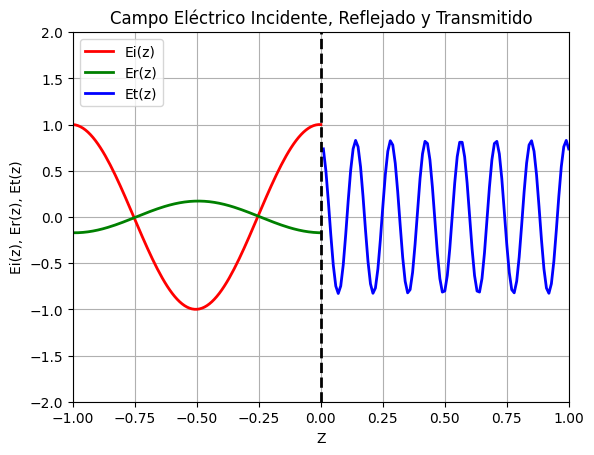

In [17]:
Sim = SimuladorInterfases(epsr2=10)
Sim.run()
#Sim.plot()
Sim.animate()

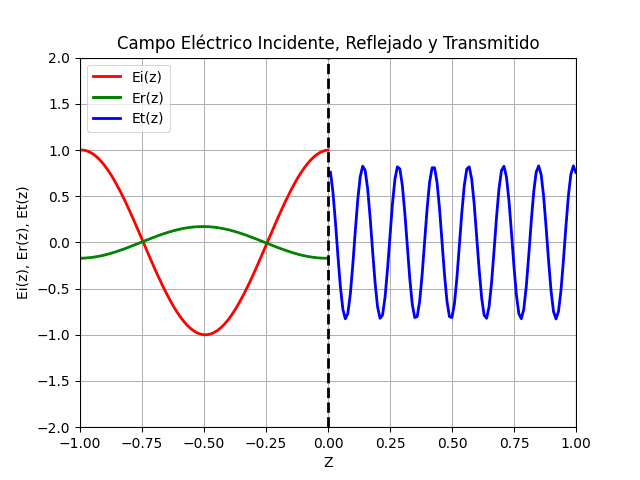

In [18]:
Image(open('/content/OndaInterfases.gif', 'rb').read())